## Vanilla Gradient Descent


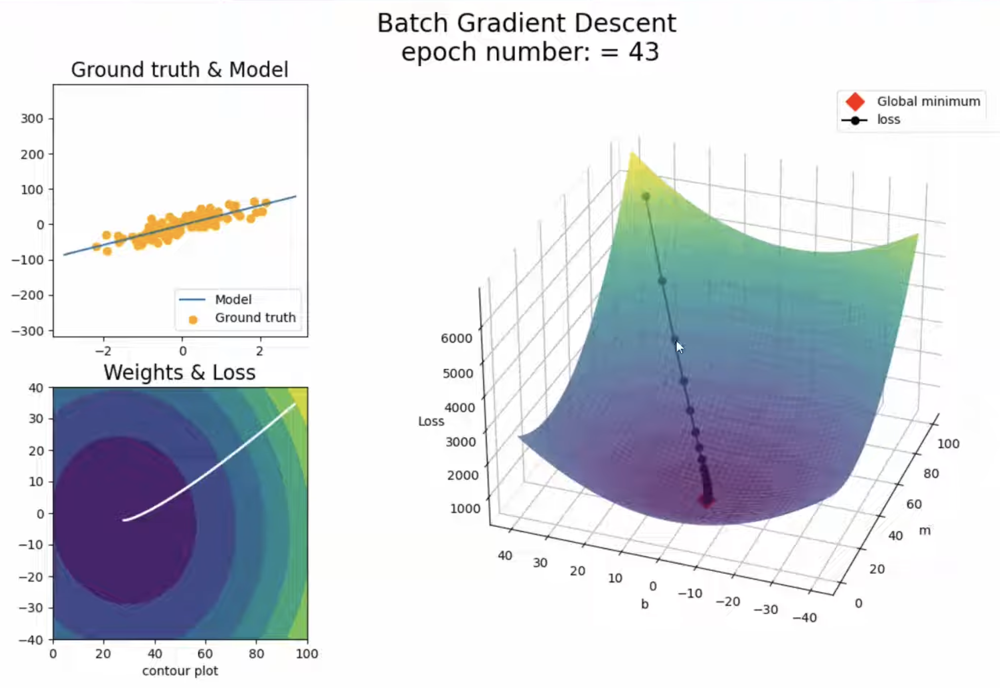

## Topic 1: What is an Optimizer & Why We Need Advanced Optimizers (Like Momentum & NAG)

### 1. Introduction

An **optimizer** is an algorithm that finds the optimal values for your neural network’s weights – specifically, the weight values that make the **loss function** as small as possible.

**Real‑life use:**  
Training any deep learning model (image recognition, language translation, etc.). Without a good optimizer, training is very slow or never reaches a good solution.

### 2. Detailed Explanation

#### What is a loss function?
A loss function measures how wrong your model’s predictions are. The goal of training is to **minimize** this loss.

#### The basic optimizer: Gradient Descent (GD)
- **Batch Gradient Descent** – uses all data to compute one update step.
- **Stochastic Gradient Descent (SGD)** – uses one random sample per update.
- **Mini‑batch Gradient Descent** – uses a small batch of samples per update.

> **Problem with basic SGD:** It is **slow**. Neural network training becomes slow because each update is small and noisy.

#### Why do we need advanced optimizers?
To make training **faster** and more efficient. Two important advanced optimizers:
1. **Momentum** (covered in previous video)
2. **Nesterov Accelerated Gradient (NAG)** – the topic of this video

### 3. Key Points

| Term | Meaning |
|------|---------|
| **Optimizer** | Algorithm that updates weights to minimise loss |
| **Loss function** | Measures model error |
| **Gradient** | Direction and magnitude of steepest increase in loss |
| **SGD** | Basic optimizer, but slow |
| **Advanced optimizer** | Speeds up training (e.g., Momentum, NAG) |

### 4. Common Mistakes

- Thinking basic SGD is always good enough → it is often too slow for deep networks.
- Confusing the *loss function* with the *optimizer* – they are different things.

### 5. Revision Notes

- **Optimizer** = weight‑updating algorithm.
- Basic gradient descent is **slow** → need advanced methods.
- Momentum and NAG are two important advanced optimizers.

---

**That’s the first topic.**  


## Topic 2: Momentum Optimizer – Review and Demonstration

### 1. Introduction

**Momentum** is an advanced optimizer that speeds up gradient descent by adding a **velocity term**. Think of it like a ball rolling down a hill – it gathers speed and keeps moving in the same direction, not just following the local slope at each point.

**Why important:** It makes training faster than basic SGD by smoothing out updates and pushing through shallow areas.

### 2. Detailed Explanation

#### The core problem Momentum solves
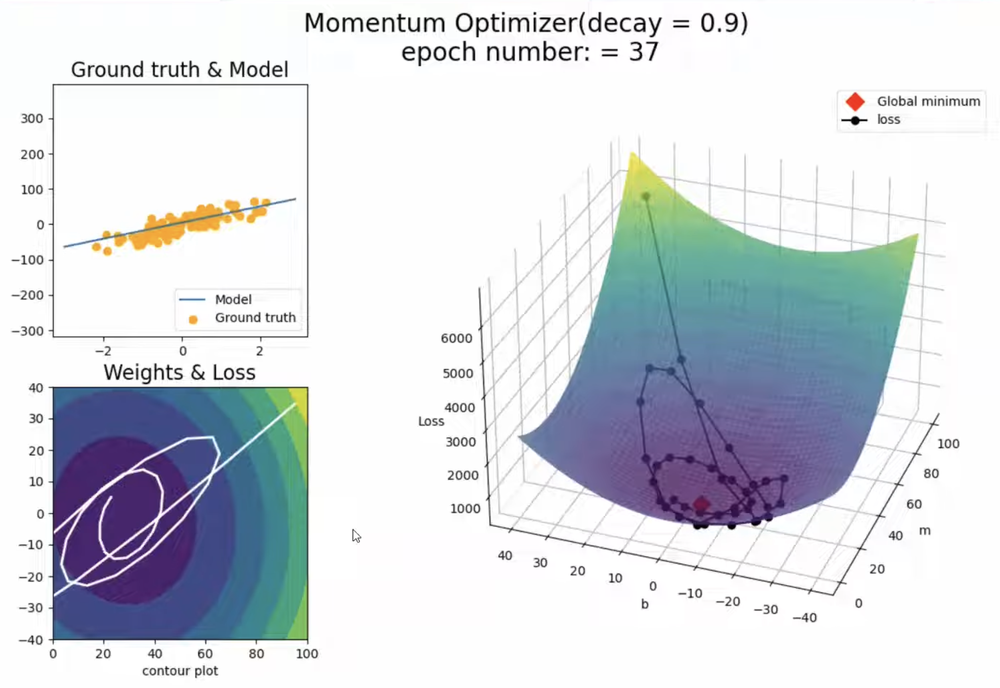
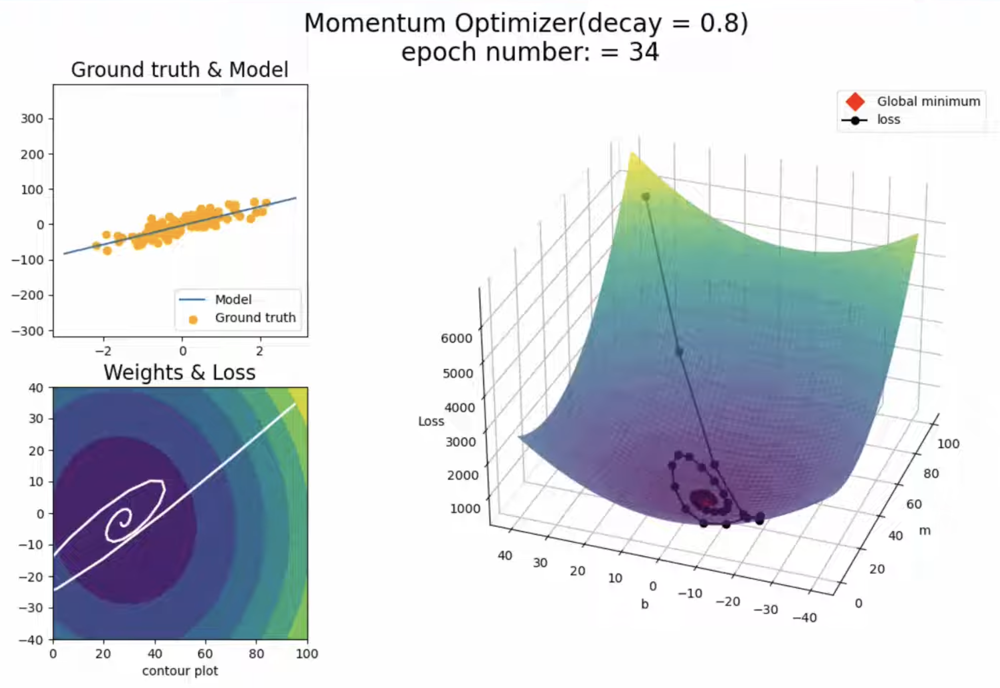
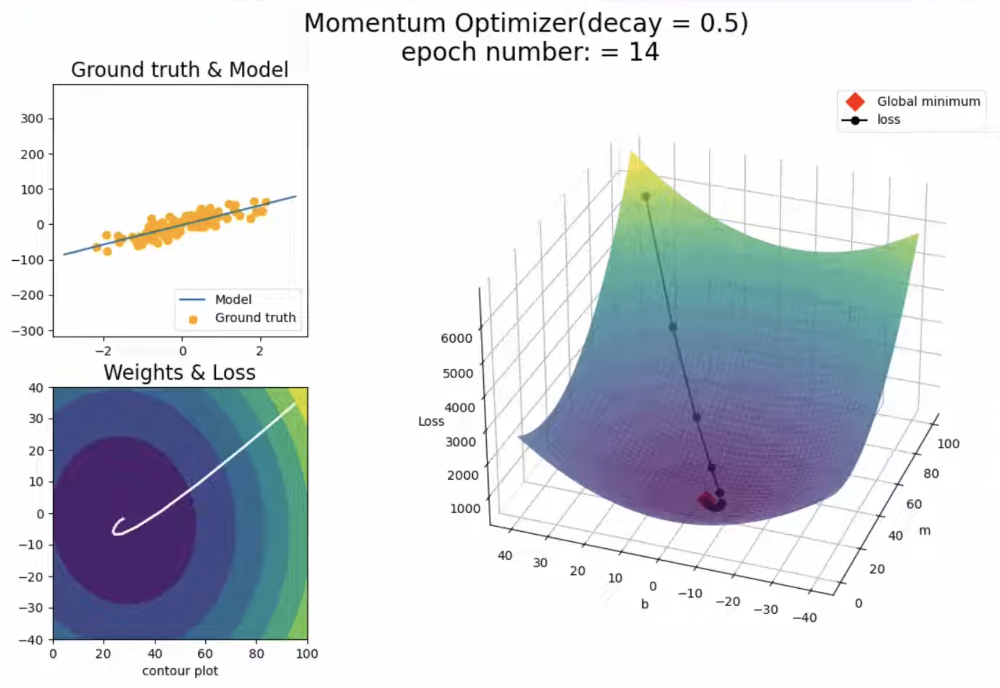
Basic SGD updates weights using only the current gradient. This is like taking a step based only on where your feet are right now – you ignore your previous movement. Momentum adds **memory** of past directions.

#### Velocity analogy
Imagine a ball rolling down a hill:
- It builds up **velocity** over time.
- Even if the hill becomes flat, the ball keeps rolling.
- If it goes up a small bump, its momentum carries it over.

#### The two components of Momentum
At every point, Momentum calculates **two things**:
1. **Previous velocity** (history of movement) – scaled by a factor β (beta)
2. **Current gradient** – scaled by the learning rate

Then it **combines** them to make the update.

> **Visual from transcript:**  
> In the contour plot (2D view of the error surface), Momentum crosses the valley, goes up the other side, turns around, crosses again with smaller oscillations, and eventually settles at the minimum – much faster than basic SGD.

#### Numbers from the demonstration
- Basic batch gradient descent: ~25–30 steps to converge.
- Momentum: ~15 steps to get near the minimum.
- By adjusting β (beta factor), you can control oscillations.

### 3. Key Points

| Concept | Explanation |
|---------|-------------|
| **Velocity (v)** | Accumulated past movement |
| **β (beta)** | Decay factor for old velocity (typical value: 0.9) |
| **How it works** | New velocity = β × old velocity + learning rate × current gradient |
| **Update rule** | New weight = old weight – new velocity |

- β = 0.9 means you give **90% weight to old velocity** and only 10% to new gradient information.
- Larger β = more momentum = faster but more oscillations.
- Momentum reaches minimum in ~15 steps vs 25–30 for basic GD.

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
|---------|----------------|---------------|
| Setting β too high (e.g., 0.99) | Too much momentum causes huge oscillations and may never settle | Start with β = 0.9 |
| Setting β too low (e.g., 0.5) | Almost like basic SGD – no speed benefit | Use 0.8–0.95 range |
| Thinking momentum always helps | On very simple surfaces it may overshoot the minimum | Monitor validation loss |

### 5. Interview/Exam Questions

**Q1:** What problem does Momentum solve in SGD?  
**A:** It solves the **slow convergence** problem by adding a velocity term that accumulates past gradients, allowing faster movement in consistent directions.

**Q2:** What does the β (beta) parameter control?  
**A:** It controls how much weight is given to the previous velocity. β = 0.9 means 90% old velocity, 10% new gradient.

**Q3:** Why does Momentum oscillate?  
**A:** Because the velocity may push it past the minimum, then the gradient pulls it back, causing it to cross back and forth until it settles.

### 6. Revision Notes

- **Momentum** = SGD + velocity (memory of past directions).
- **β** = decay factor (typical = 0.9).
- **Two components combined:** old velocity + current gradient.
- **Faster than SGD** but can still oscillate.
- **Oscillations** are the main problem – NAG solves this.

---

**That’s Topic 2.**  


## Topic 3: The Problem with Momentum – Oscillations
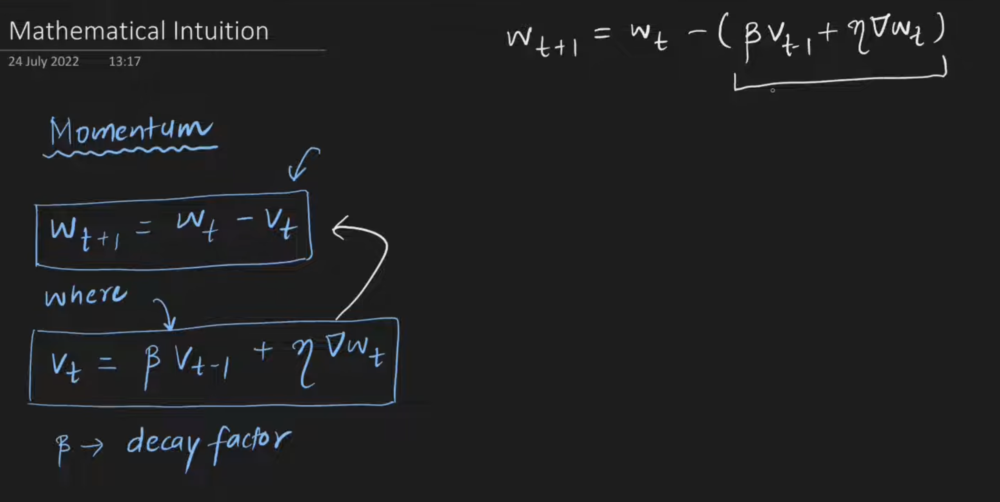
### 1. Introduction

While Momentum is much faster than basic SGD, it has a **major weakness**: oscillations. The ball (your optimizer) often rushes past the minimum, then has to turn back, cross again, and slowly settle down. This wastes time and can be especially problematic on **non‑convex** (complex, wavy) error surfaces.

**Real‑life impact:**  
On simple problems (like the linear regression shown), you can reduce oscillations by lowering β. But on complex deep learning problems with many hills and valleys, oscillations can significantly slow down training – or even prevent you from finding a good minimum.

### 2. Detailed Explanation

#### What does “oscillation” mean in optimisation?
Oscillation happens when the optimizer repeatedly **overshoots** the minimum and then **corrects**, crossing back and forth like a pendulum slowly coming to rest.

#### Why does Momentum oscillate?
Because Momentum calculates **both components** (velocity + gradient) **at the same point**, then jumps. It does not “look ahead” to see if the slope is about to change.

#### Visual from the transcript
In the contour plot demonstration:
- Momentum starts at a random point.
- It rushes forward quickly (good).
- But then it **crosses over** the minimum area.
- It goes up the other side.
- It turns around, crosses again (smaller crossing).
- This continues, with each oscillation getting smaller.

> **Number from the demo:**  
> Momentum took about 15 steps to get near the minimum, but the path was full of back‑and‑forth oscillations.

#### The problem is worse on non‑convex surfaces
- **Convex** problem (bowl‑shaped): oscillations are manageable – you can reduce β.
- **Non‑convex** problem (many local hills and valleys): oscillations become **unpredictable and costly**. The optimizer may waste steps going back and forth in narrow valleys.

#### What controls oscillations?
The β (beta) factor:
- High β (e.g., 0.95) → more momentum → faster but **more oscillations**.
- Lower β (e.g., 0.8) → less momentum → slower but **fewer oscillations**.

You can tune β to reduce oscillations, but you cannot completely eliminate them with standard Momentum.

### 3. Key Points

| Problem | Explanation |
|---------|-------------|
| **Oscillation** | Optimizer repeatedly crosses past the minimum and returns |
| **Cause** | Momentum calculates update based only on current point, not future slope |
| **Convex surface** | Oscillations are manageable |
| **Non‑convex surface** | Oscillations cause significant delays |
| **β tuning** | Lower β = fewer oscillations but slower; higher β = faster but more oscillations |

### 4. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
|---------|----------------|---------------|
| Ignoring oscillations | On complex problems, they can double training time | Use NAG (next topic) to reduce oscillations |
| Setting β too high on non‑convex problems | Severe oscillations may prevent convergence | Start with β = 0.9 and reduce if oscillations are large |
| Thinking oscillations are always fine | On simple problems they are minor, but real‑world problems are rarely simple | Always monitor the loss curve for wiggles |

### 5. Interview/Exam Questions

**Q1:** What is the main disadvantage of Momentum?  
**A:** Oscillations – it tends to overshoot the minimum and cross back and forth, especially on non‑convex error surfaces.

**Q2:** Can you completely eliminate oscillations by tuning β?  
**A:** No. You can reduce them by lowering β, but that also reduces speed. You cannot fully eliminate them with standard Momentum.

**Q3:** Why are oscillations worse on non‑convex problems?  
**A:** Non‑convex surfaces have many local hills and valleys. Oscillations can trap the optimizer or cause it to bounce around inefficiently, whereas on a simple convex bowl the oscillations are regular and predictable.

### 6. Revision Notes

- **Oscillation** = overshooting + correcting, back and forth.
- **Cause** = Momentum uses only current point info.
- **Bigger problem on non‑convex** surfaces (most real deep learning problems).
- **β tuning** helps but does not solve completely.
- **NAG** (next topic) is designed specifically to **dampen (reduce) oscillations**.

---

**That’s Topic 3.**  


## Topic 4: Nesterov Accelerated Gradient (NAG) – Concept & Mathematics

### 1. Introduction

**NAG (Nesterov Accelerated Gradient)** is an improvement over Momentum. It reduces oscillations and often performs better than standard Momentum. The key idea is simple: instead of calculating the gradient at your current position, you first take a **"look‑ahead"** step using momentum, then calculate the gradient at that future position.

**Real‑life use:**  
Any deep learning problem where Momentum oscillates – which is most real‑world non‑convex problems. NAG is implemented in all major deep learning libraries (Keras, PyTorch, TensorFlow).

### 2. Detailed Explanation
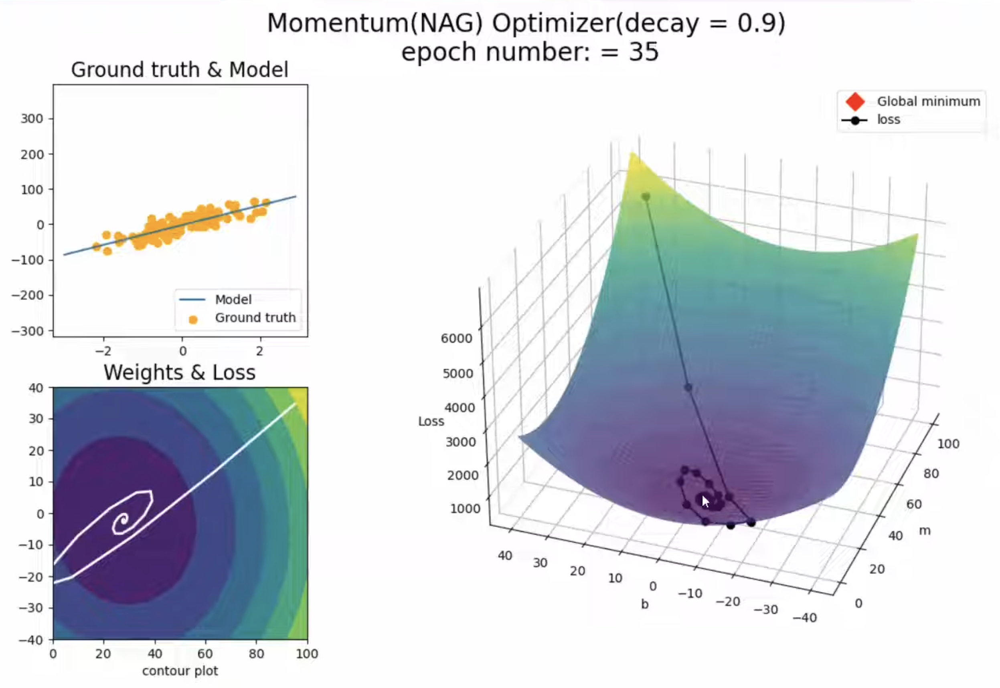
#### The core intuition – "Look before you leap"

Think of Momentum as:
1. You are at point A.
2. You combine your current velocity + gradient at A.
3. You jump to point B.

NAG changes the order:
1. You are at point A.
2. **First** – take a momentum jump (based only on old velocity) to a **look‑ahead point**.
3. **Then** – calculate the gradient at that look‑ahead point.
4. **Finally** – use that gradient to make your actual update from A.

> **Analogy from the transcript:**  
> In Momentum, you calculate both momentum and gradient at the same spot, then jump.  
> In NAG, you first jump with momentum (look ahead), then see the slope there, then adjust.

#### Why does this help oscillations?
Because the look‑ahead point is **further down the path**. If you are about to overshoot a minimum, the slope at the look‑ahead point will already be pointing **backward** (opposite direction). So your final update gets a corrective signal **before** you actually overshoot.

This "early warning" dampens oscillations.

#### Mathematical formulation (step by step)

**First, recall Momentum update rules:**
```
vₜ = β·vₜ₋₁ + η·∇L(wₜ₋₁)     (velocity update)
wₜ = wₜ₋₁ – vₜ                (weight update)
```
Where:
- β = momentum decay factor (e.g., 0.9)
- η = learning rate
- ∇L(w) = gradient of loss at w

**Now NAG – two equivalent ways to write it:**

**Method 1 (conceptual):**
```
1. Look‑ahead point = wₜ₋₁ – β·vₜ₋₁
2. Compute gradient at look‑ahead point: ∇L(look‑ahead)
3. vₜ = β·vₜ₋₁ + η·∇L(look‑ahead)
4. wₜ = wₜ₋₁ – vₜ
```

**Method 2 (standard form from transcript):**
```
vₜ = β·vₜ₋₁ + η·∇L(wₜ₋₁ – β·vₜ₋₁)
wₜ = wₜ₋₁ – vₜ
```

> **Key difference from Momentum:**  
> Momentum uses ∇L(wₜ₋₁) – gradient at current point.  
> NAG uses ∇L(wₜ₋₁ – β·vₜ₋₁) – gradient at the look‑ahead point.

#### Visual summary from transcript

| Step | Momentum | NAG |
|------|----------|-----|
| 1 | At current point w | At current point w |
| 2 | Calculate v using gradient at w | **First** jump to look‑ahead = w – β·v |
| 3 | Jump to new point | Calculate gradient at look‑ahead |
| 4 | (done) | Use that gradient to update v, then jump from w |

### 3. Key Points

| Concept | Momentum | NAG |
|---------|----------|-----|
| **Gradient location** | At current point | At look‑ahead point |
| **Look‑ahead** | No | Yes (w – β·vₜ₋₁) |
| **Oscillation damping** | Limited (via β) | Stronger (anticipates slope changes) |
| **Speed** | Fast | Slightly faster (on oscillating problems) |

### 4. Syntax / Structure (Keras implementation – from transcript)

In **Keras**, NAG is implemented as a parameter inside the SGD optimizer:

```python
# Basic SGD (no momentum)
optimizer = SGD(learning_rate=0.01, momentum=0.0, nesterov=False)

# Momentum
optimizer = SGD(learning_rate=0.01, momentum=0.9, nesterov=False)

# NAG (Nesterov Accelerated Gradient)
optimizer = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
```

**Parameter explanation:**
- `momentum` = β value (typically 0.9) – must be set > 0
- `nesterov = True` – enables NAG instead of standard Momentum

### 5. Common Mistakes

| Mistake | Why it's wrong | How to avoid |
|---------|----------------|---------------|
| Setting `nesterov=True` without `momentum` | NAG requires a momentum value; it won't work with momentum=0 | Always set both: momentum > 0 and nesterov = True |
| Thinking NAG is always faster | On very smooth convex problems, difference is small | Test both – NAG shines on oscillating/non‑convex problems |
| Confusing the look‑ahead point as the final update | The look‑ahead is only used to compute gradient, not as the final position | Remember: you still start from original w and take one update |

### 6. Interview/Exam Questions

**Q1:** What is the single biggest difference between Momentum and NAG?  
**A:** Momentum calculates gradient at the **current** weight position. NAG first takes a momentum‑based look‑ahead step, then calculates gradient at that **future** position.

**Q2:** How does NAG reduce oscillations?  
**A:** If you are about to overshoot a minimum, the look‑ahead point will already be on the far side. The slope there points backward, giving an early correction before you overshoot.

**Q3:** In Keras, how do you implement NAG?  
**A:** Use `SGD(learning_rate=..., momentum=..., nesterov=True)`. Both momentum and nesterov must be set.

**Q4:** Does NAG always outperform Momentum?  
**A:** No. On simple convex problems, the difference is small. On non‑convex problems with oscillations, NAG typically performs better.

### 7. Revision Notes

- **NAG = Momentum with look‑ahead**.
- **Look‑ahead point** = current w – β·(old velocity).
- Compute gradient **at look‑ahead**, not at current point.
- **Dampens oscillations** by anticipating slope changes.
- In Keras: `SGD(momentum=0.9, nesterov=True)`.

---

**That’s Topic 4.**  


## Topic 5: Geometric Analysis – Why NAG Dampens Oscillations (Step‑by‑Step Walkthrough)

### 1. Introduction

The transcript provides a detailed geometric comparison of Momentum and NAG on the same error surface. Understanding this step‑by‑step walkthrough is the key to truly grasping **why** NAG reduces oscillations. We will trace both optimizers from start to minimum.

### 2. Detailed Explanation – Momentum Path (Review)

Let's follow Momentum step by step on a 2D error surface (horizontal axis = weight value, vertical axis = loss).

> **Important:** At every point, Momentum calculates **two things together**: the momentum (velocity) and the gradient at that same point.

**Step by step:**
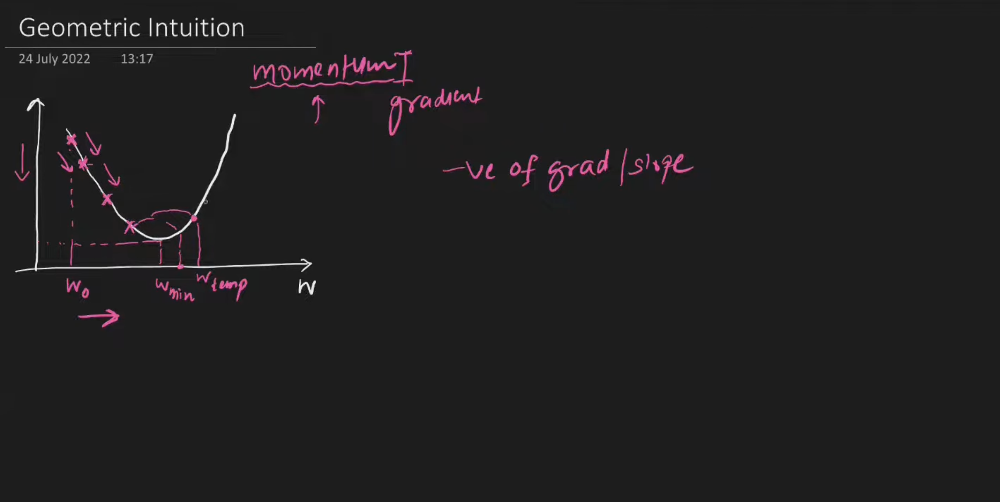
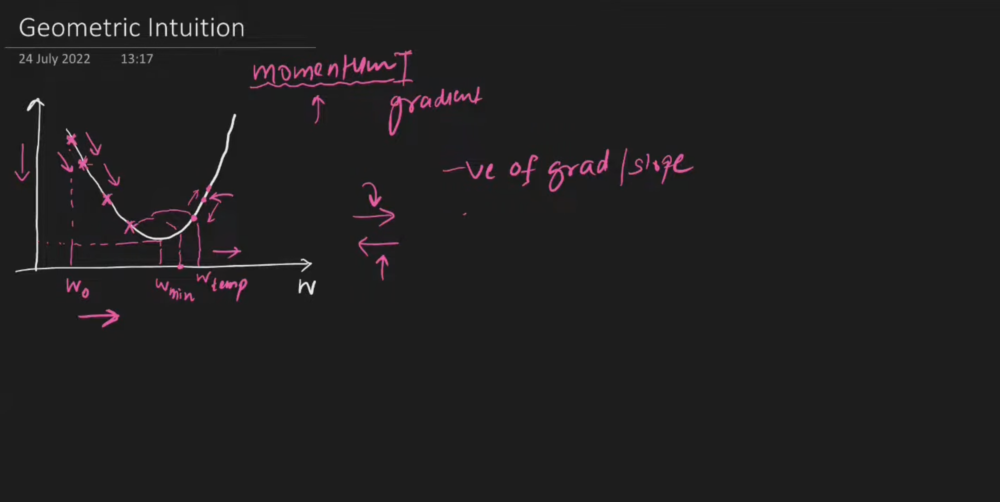
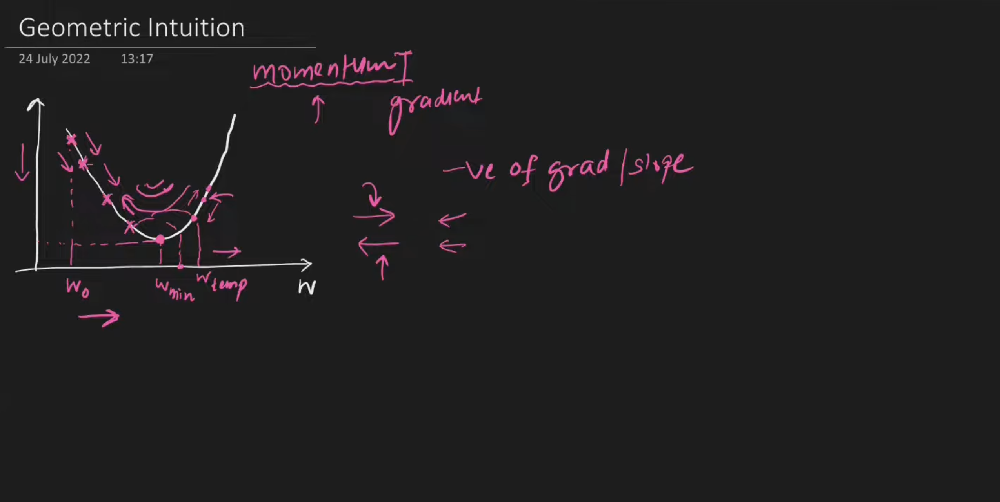

| Step | Position | What happens | Where you go |
|------|----------|--------------|---------------|
| Start | Random point | Momentum = 0 initially | |
| 1 | Start | Slope is negative (loss decreases as weight increases) | Move in positive direction |
| 2 | New point | Momentum builds in positive direction; gradient also positive | Move further positive |
| 3 | Further positive | Strong positive momentum; gradient still positive | Move even further positive |
| 4 | Even further | Positive momentum; **now gradient becomes negative** (you passed the minimum!) | Conflicting signals: momentum says go positive, gradient says go negative |
| 5 | Overshoot point | Momentum dominates because β=0.9 (90% weight to old velocity) | Still move positive (further overshoot) |
| 6 | Maximum overshoot | Finally momentum also becomes negative | Turn around, start coming back |
| 7 | Coming back | Small positive? Wait, check transcript: "You will move ahead wearing over suit, took a U turn, came back, chota U turn come back, and smaller and smaller" | Oscillations get smaller each time |
| Final | Minimum | Eventually settles | Done |

**Result of Momentum:** Overshoot → U‑turn → come back → overshoot less → repeat until settled.

### 3. Detailed Explanation – NAG Path (The Improvement)
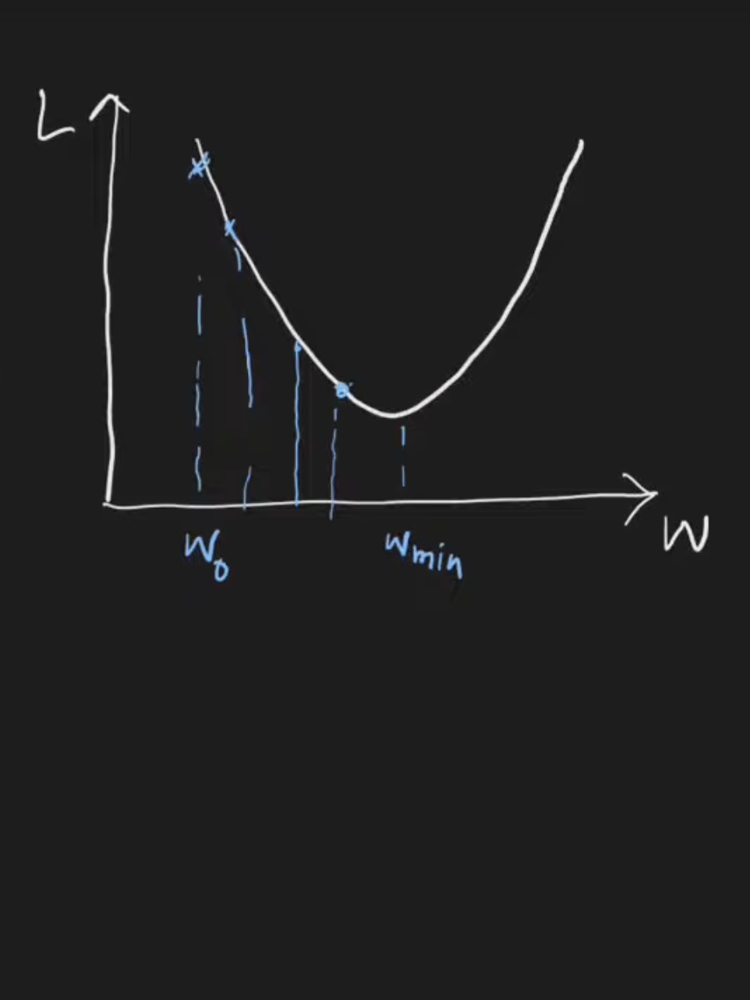
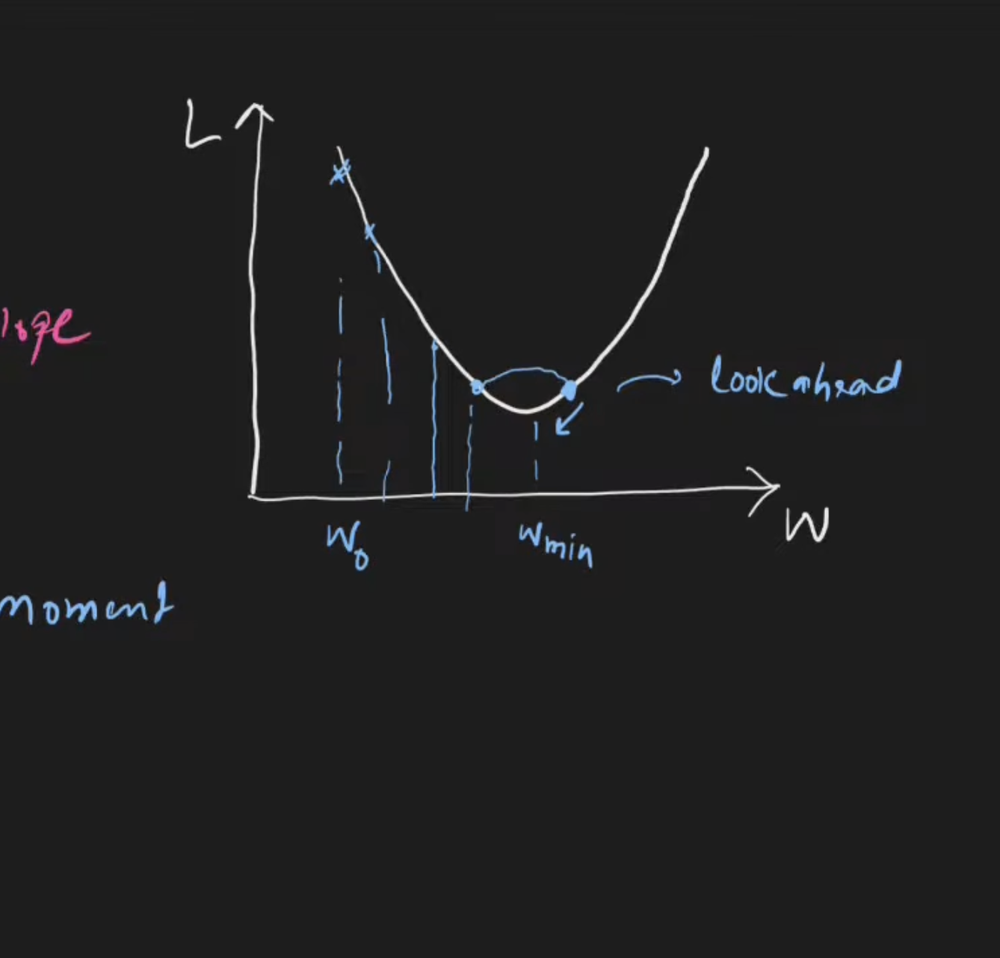

Now follow **NAG** on the same surface.

> **Key difference:** NAG does NOT calculate gradient at the current point. It first jumps to a look‑ahead point, then calculates gradient there.

**Step by step:**

| Step | Position | What happens in NAG | Where you go |
|------|----------|---------------------|---------------|
| Start | Point A | Initial momentum = 0 | |
| 1 | Point A | First apply momentum to get **look‑ahead point** | Look‑ahead = A + momentum jump |
| 2 | Look‑ahead | Calculate gradient at look‑ahead | This gradient already points backward if you were about to overshoot |
| 3 | Original point A | Use that backward‑pointing gradient in your velocity update | Final update is smaller/corrected |
| 4 | New position | You end up closer to the minimum, with less overshoot | |

**The critical insight from transcript:**

> "Why do you know in advance what will happen next? And you can make your decision accordingly."

In Momentum, you overshoot first, then realise your mistake, then correct.  
In NAG, the look‑ahead gradient **warns you before you overshoot**.

### 4. Side‑by‑Side Geometric Comparison

Based on the transcript's geometry explanation:

| Moment | Momentum | NAG |
|--------|----------|-----|
| Approaching minimum from left | Positive momentum + positive gradient → you overshoot to the right | Look‑ahead point is already to the right of minimum → gradient there is negative → you don't overshoot as much |
| Just past minimum (right side) | Momentum still positive (from previous), gradient negative → conflict, but momentum dominates | Look‑ahead is even further right → stronger negative gradient → correction is larger |
| Turning around | Takes time to reverse momentum | Reverses more quickly because look‑ahead gave early warning |
| Oscillation amplitude | Large → medium → small → settles | Smaller from the start → settles faster |

### 5. Summary Table – Momentum vs NAG

| Feature | Momentum | NAG |
|---------|----------|-----|
| **Where gradient is calculated** | At current position | At look‑ahead position (current – β·v) |
| **Does it anticipate slope changes?** | No | Yes |
| **Overshoot behaviour** | Overshoots, then corrects | Corrects before overshoot |
| **Oscillation amplitude** | Starts large, decays | Starts smaller |
| **Convergence speed** | Fast, but slowed by oscillations | Fast + less oscillation overhead |

### 6. The One Disadvantage of NAG (from transcript)

The transcript mentions one potential disadvantage:

> "What can happen if you are local minimum? Imagine a model like this... What does NAG do? It dampens momentum. If your ball rolls from here, maybe it had so much momentum that it would cross this and come here, but in NAG you are suppressing that high momentum."

**Translation:**  
- Momentum with high β can sometimes **power through** a small local minimum and find a better global minimum.
- NAG dampens oscillations, which is good – but it also slightly reduces the "push" that might help escape poor local minima.
- In some datasets, this could be a disadvantage.

**Practical advice:** Try both. NAG is generally better, but test on your problem.

### 7. Common Mistakes

| Mistake | Why it's wrong |
|---------|----------------|
| Thinking NAG never overshoots | NAG still overshoots, but much less than Momentum |
| Believing NAG's look‑ahead is the final update position | Look‑ahead is only for gradient calculation; you still update from original point |
| Ignoring the potential disadvantage | On problems where escaping local minima is critical, standard Momentum might accidentally help |

### 8. Interview/Exam Questions

**Q1:** Walk through one update step of NAG on a 1D error surface where the current point is to the left of the minimum.  
**A:** 1) Current point w (left of min). 2) Look‑ahead = w – β·v (further right, possibly past min). 3) Gradient at look‑ahead is negative (since past min). 4) Update velocity using this negative gradient, reducing the final step size. 5) Update weight from original w, landing closer to min with less overshoot.

**Q2:** Why does NAG produce smaller oscillations than Momentum?  
**A:** Because it calculates the gradient at a look‑ahead point. If that point is past the minimum, the negative gradient provides an early correction, preventing a large overshoot before it happens.

**Q3:** Could NAG ever be worse than Momentum?  
**A:** Yes, if escaping a poor local minimum requires high momentum. NAG's oscillation damping slightly reduces the "push" that might carry you out of a local minimum.

### 9. Revision Notes

- **Momentum path:** Overshoot → U‑turn → smaller overshoot → settle (oscillations decay).
- **NAG path:** Look‑ahead gradient warns before overshoot → smaller initial oscillations.
- **Key phrase:** "Know in advance what will happen next."
- **One disadvantage:** May reduce ability to escape local minima (rare, but possible).
- **Verdict from transcript:** NAG mostly performs better than Momentum.

---

**That’s Topic 5.**  


## Topic 6: NAG Implementation in Keras & Complete Summary

### 1. Introduction

The transcript ends with practical implementation guidance for **Keras** (TensorFlow's high‑level API). You can implement three different optimizers using the same `SGD` class by changing just a few parameters. This makes experimentation very easy.

### 2. Detailed Explanation – Keras Implementation

In Keras, all three optimizers (basic SGD, Momentum, and NAG) are created using the same `SGD` class from `keras.optimizers`.

#### The three variations:

| Optimizer | `learning_rate` | `momentum` | `nesterov` |
|-----------|----------------|------------|------------|
| Basic SGD | 0.01 (example) | 0.0 | `False` |
| Momentum | 0.01 (example) | 0.9 (β value) | `False` |
| NAG | 0.01 (example) | 0.9 (β value) | `True` |

> **Important:** For NAG, you must set **both** `momentum > 0` and `nesterov = True`. If `momentum = 0`, NAG does nothing (it becomes basic SGD).

### 3. Syntax / Structure (Keras Code)

```python
from tensorflow.keras.optimizers import SGD

# 1. Basic SGD (no momentum, no NAG)
optimizer_basic = SGD(learning_rate=0.01, momentum=0.0, nesterov=False)

# 2. Standard Momentum
optimizer_momentum = SGD(learning_rate=0.01, momentum=0.9, nesterov=False)

# 3. Nesterov Accelerated Gradient (NAG)
optimizer_nag = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
```

**Line‑by‑line explanation:**

| Code part | Purpose |
|-----------|---------|
| `SGD(...)` | Creates an SGD optimizer object |
| `learning_rate=0.01` | Step size for each update (typical range: 0.1 to 0.0001) |
| `momentum=0.9` | The β factor. 0.9 means 90% weight to previous velocity. Set to 0.0 for no momentum |
| `nesterov=False/True` | `False` = standard Momentum (if momentum > 0). `True` = NAG (requires momentum > 0) |

### 4. Using the Optimizer in a Keras Model

```python
# Compile a model with NAG optimizer
model.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss='mean_squared_error',
    metrics=['accuracy']
)

# Then train normally
model.fit(X_train, y_train, epochs=50)
```

### 5. Complete Summary – Momentum vs NAG

| Aspect | Momentum | NAG |
|--------|----------|-----|
| **Full name** | Momentum Optimizer | Nesterov Accelerated Gradient |
| **Core idea** | Add velocity (memory of past gradients) | Add look‑ahead before gradient calculation |
| **Gradient location** | At current weight | At look‑ahead weight (w – β·v) |
| **Oscillations** | Present, can be large | Dampened (reduced) |
| **Speed** | Faster than basic SGD | Slightly faster than Momentum on oscillating problems |
| **Keras parameter** | `momentum=0.9, nesterov=False` | `momentum=0.9, nesterov=True` |
| **When to use** | Simple convex problems | Most real‑world non‑convex problems |
| **Disadvantage** | Oscillations slow convergence | May slightly reduce ability to escape local minima |

### 6. Common Mistakes (Keras‑specific)

| Mistake | Why it's wrong | Correct way |
|---------|----------------|-------------|
| Setting `nesterov=True` without `momentum` | NAG requires a momentum value; without it, nothing changes | Always set both: `momentum > 0` and `nesterov=True` |
| Forgetting to import `SGD` | `NameError` | Use `from tensorflow.keras.optimizers import SGD` |
| Using very different learning rates for Momentum vs NAG | They behave differently; compare fairly | Use the same learning rate when comparing performance |

### 7. Interview/Exam Questions

**Q1:** Write the Keras code to create a NAG optimizer with learning rate 0.001 and β = 0.95.  
**A:** `SGD(learning_rate=0.001, momentum=0.95, nesterov=True)`

**Q2:** What happens if you set `nesterov=True` but `momentum=0.0`?  
**A:** You get basic SGD (no momentum, no look‑ahead) because NAG requires a momentum value to function.

**Q3:** Name three optimizers you can create from the Keras `SGD` class.  
**A:** Basic SGD (`momentum=0`), Momentum (`momentum>0, nesterov=False`), and NAG (`momentum>0, nesterov=True`).

**Q4:** Why does the transcript say NAG mostly performs better than Momentum?  
**A:** Because NAG dampens oscillations by anticipating slope changes via the look‑ahead gradient, leading to faster and more stable convergence on most non‑convex problems.

### 8. Revision Notes – Entire Transcript (Quick Recap)

| Topic | Key takeaway |
|-------|--------------|
| **Optimizer** | Algorithm that finds weights minimising loss |
| **Basic SGD** | Slow – needs advanced methods |
| **Momentum** | Adds velocity – faster but oscillates |
| **Oscillations** | Momentum's main problem – overshoot and correct |
| **NAG** | Look‑ahead + gradient at future point – dampens oscillations |
| **Geometric difference** | Momentum: gradient at current point. NAG: gradient at look‑ahead |
| **Keras implementation** | `SGD(learning_rate, momentum, nesterov=True)` |
| **Disadvantage** | NAG may reduce ability to escape local minima (rare) |

---

**That’s the final topic (Topic 6).**  
